<a href="https://colab.research.google.com/github/GandlinAlexandr/ML_HW1_base/blob/main/AI_HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

>Чтобы гарантировать воспроизводимость результатов при повторном запуске кода. При повторном запуске (в том числе на другом компьютере) случайные генерации будут теми же, что и при первом запуске, то есть фиксированными.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [ ]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [ ]:
# Отобразите 10 случайных строк тренировочного датасета
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [ ]:
# Отобразите первые 5 объектов тестового датасета
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [ ]:
# Отобразите последние 5 объектов тестового датасета
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [ ]:
# Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
df_train.columns[df_train.isna().any()]

Index(['mileage', 'engine', 'max_power', 'torque', 'seats'], dtype='object')

In [ ]:
# Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
df_test.columns[df_test.isna().any()]

Index(['mileage', 'engine', 'max_power', 'torque', 'seats'], dtype='object')

In [ ]:
# Посмотрите, есть ли в данных явные дубликаты
print('Есть ли дупликаты:', df_train.duplicated().any())

Есть ли дупликаты: True


In [ ]:
#!pip install ydata_profiling
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.9/17.9 MB 16.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 19.6 MB/s eta 0:00:00


In [ ]:
# Постройте дашборд, используя ydata-profilling
from ydata_profiling import ProfileReport

profile_report_train = ProfileReport(df_train, title='Pandas Profiling Report')

profile_report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_report_test = ProfileReport(df_test, title='Pandas Profiling Report')

profile_report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [ ]:
# Проверяем, какие есть единицы измерения mileage
print('Train:', df_train['mileage'].apply(lambda x: x.split(' ')[1] if type(x)!=float else x).unique())
print('Test:', df_test['mileage'].apply(lambda x: x.split(' ')[1] if type(x)!=float else x).unique())

Train: ['kmpl' 'km/kg' nan]
Test: ['kmpl' nan 'km/kg']


In [ ]:
# Проверяем, какие есть единицы измерения engine
print('Train:', df_train['engine'].apply(lambda x: x.split(' ')[1] if type(x)!=float else x).unique())
print('Test:', df_test['engine'].apply(lambda x: x.split(' ')[1] if type(x)!=float else x).unique())

Train: ['CC' nan]
Test: ['CC' nan]


In [ ]:
# Обнаружено одно значение max_power в трейне, где просто указаны единицы измерения
df_train['max_power'][df_train['max_power'] == ' bhp'] = np.NAN

<ipython-input-112-390f50c62d71>:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_train['max_power'][df_train['max_power'] == ' bhp'] = np.NAN
<ipython-input-112-390f50c62d71>:2: SettingWithCopyWarning: 
A value is trying to be set on a c

In [ ]:
# В трейне есть нули - невозможное значение - это суть пропск
df_train[df_train['max_power'] == '0']
df_train['max_power'][df_train['max_power'] == '0'] = np.NAN

<ipython-input-113-d7ce85f419bc>:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_train['max_power'][df_train['max_power'] == '0'] = np.NAN
<ipython-input-113-d7ce85f419bc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy

In [ ]:
# Проверяем, какие есть единицы измерения max_power
print('Train:', df_train['max_power'].apply(lambda x:
                                             (x.split(' ')[1] if len(x.split(' ')) >= 2 else np.NAN)
                                             if type(x)!=float else x).unique())
print('Test:', df_test['max_power'].apply(lambda x: x.split(' ')[1] if type(x)!=float else x).unique())

Train: ['bhp' nan]
Test: ['bhp' nan]


In [ ]:
# Генерация числовых значений в тренировочных данных
df_train['mileage'] = df_train['mileage'].apply(lambda x:
 (float(x.split(' ')[0])
 if x.split(' ')[1] == 'kmpl'
  else float(x.split(' ')[0])*1.4) # Переводим  km/kg в kmpl
 if type(x)!=float
   else x)

df_train['engine'] = df_train['engine'].apply(lambda x: float(x.split(' ')[0]) if type(x)!=float else x)

df_train['max_power'] = df_train['max_power'].apply(lambda x: float(x.split(' ')[0]) if type(x)!=float else x)

df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,"24@ 1,900-2,750(kgm@ rpm)",5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.30,1248.0,73.90,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,140Nm@ 1800-3000rpm,5.0


In [ ]:
# Медианы трейна
train_median_mileage = df_train['mileage'].median()
train_median_engine = df_train['engine'].median()
train_median_max_power = df_train['max_power'].median()
train_median_seats = df_train['seats'].median()

In [ ]:
# Заполнение медианой в тренировочных данных
df_train['mileage'] = df_train['mileage'].fillna(train_median_mileage)
df_train['engine'] = df_train['engine'].fillna(train_median_engine)
df_train['max_power'] = df_train['max_power'].fillna(train_median_max_power)
df_train['seats'] = df_train['seats'].fillna(train_median_seats)

print('Столбцы с пропущенными значениями:', df_train.columns[df_train.isna().any()])

Столбцы с пропущенными значениями: Index(['torque'], dtype='object')


In [ ]:
# Генерация числовых значений в тестовых данных
df_test['mileage'] = df_test['mileage'].apply(lambda x:
 (float(x.split(' ')[0])
 if x.split(' ')[1] == 'kmpl'
  else float(x.split(' ')[0])*1.4) # Переводим  km/kg в kmpl
 if type(x)!=float
   else x)

df_test['engine'] = df_test['engine'].apply(lambda x: float(x.split(' ')[0]) if type(x)!=float else x)

df_test['max_power'] = df_test['max_power'].apply(lambda x: float(x.split(' ')[0]) if type(x)!=float else x)

df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96 Nm at 3000 rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.8Nm@ 4000rpm,5.0


In [ ]:
# Заполнение в тестовых данных
df_test['mileage'] = df_test['mileage'].fillna(train_median_mileage)
df_test['engine'] = df_test['engine'].fillna(train_median_engine)
df_test['max_power'] = df_test['max_power'].fillna(train_median_max_power)
df_test['seats'] = df_test['seats'].fillna(train_median_seats)

print('Столбцы с пропущенными значениями:', df_test.columns[df_train.isna().any()])

Столбцы с пропущенными значениями: Index(['torque'], dtype='object')


### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


>Буду предполагать, что целевая переменная - это ```selling_price```.

In [ ]:
# Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько?
print('Есть ли в трейне объекты с одинаковым признаковым описанием:', df_train.drop(['selling_price'], axis=1).duplicated().any())
print('Число:', df_train.drop(['selling_price'], axis=1).duplicated().sum())

Есть ли в трейне объекты с одинаковым признаковым описанием: True
Число: 1159


In [ ]:
# Отобразите такие объекты
df_train[df_train.drop(['selling_price'], axis=1).duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,82.00,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.00,995.0,62.00,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.40,1498.0,98.63,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,140Nm@ 1800-3000rpm,5.0


In [ ]:
# Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю
df_train = df_train.drop_duplicates(subset=list(df_train.drop(['selling_price'], axis=1).columns), keep='first')

In [ ]:
# Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков
df_train = df_train.reset_index(drop=True)

In [ ]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

>Эти задачи уже выполнил до данного шага. Так как думал, что этого от меня там и требовали (Плюс еще заменил пропуски медианами...):
>> * [x] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
>> * [x] Приведите тип данных к ``float``.

In [ ]:
#Удалите столбец torque
df_train = df_train.drop(['torque'], axis=1)
df_test = df_test.drop(['torque'], axis=1)

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [ ]:
# Осуществите приведение столбцов к необходимому типу

df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

In [ ]:
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,int64


In [ ]:
df_test.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,int64


In [ ]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5
...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,5
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,5
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,5
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,5


In [ ]:
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498,112.00,7
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497,108.50,5
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799,130.00,5
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498,98.60,5
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172,65.00,5
...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086,68.05,5
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197,81.83,5
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197,78.90,5


### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [ ]:
# Посчитайте основные статистики по числовым столбцам для трейна
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.544906,1429.448973,87.952905,5.426712
std,4.095622,5.354320e+05,6.007114e+04,4.228385,485.662834,31.577030,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,32.800000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,17.000000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.330000,1248.000000,82.000000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,46.816000,3604.000000,400.000000,14.000000


In [ ]:
# Посчитайте основные статистики по числовым столбцам для трейна
df_train.describe(include=object)

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [ ]:
# Посчитайте основные статистики по числовым столбцам для теста
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.412846,1454.87600,90.844330,5.403000
std,4.012149,7.585539e+05,48486.218662,4.090369,521.99574,34.892709,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.587500,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.330000,1248.00000,82.425000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.320000,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,45.164000,3604.00000,280.000000,9.000000


In [ ]:
# Посчитайте основные статистики по числовым столбцам для теста
df_test.describe(include=object)

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [ ]:
assert df_train.shape == (5840, 13)

>Ассает неверен. Мы же удалили столбец ```torque```. Поэтому столбцов 12.

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

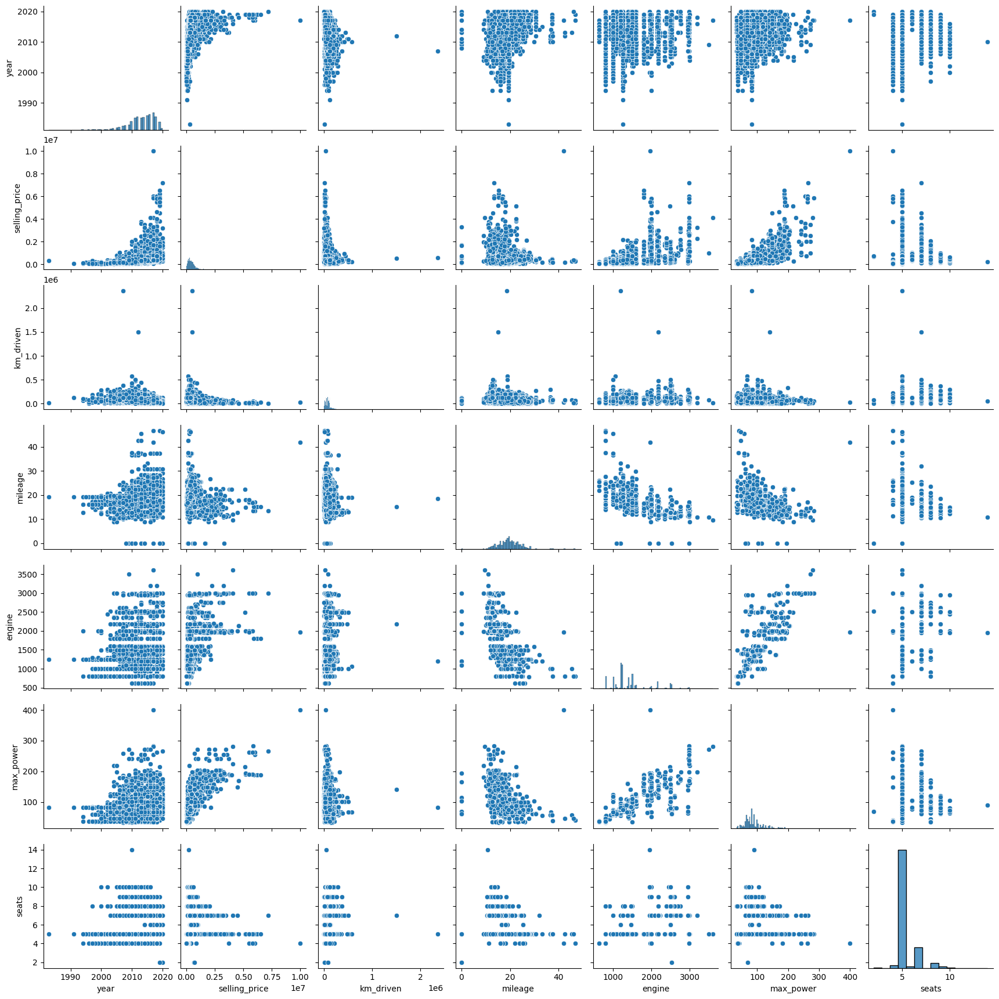

In [ ]:
# Воспользуйтесь pairplot из библиотеки seabron, чтобы визуализировать попарные распределения числовых признаков для train
sns.pairplot(df_train)

Можно ли предположить на основе распределений связь признаков с целевой переменной?
> Чтобы судить о связи как причинности, нужны дополнительные сведения, способные отделить причинность от корреляции. Но предположить можно.

Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?
>Да, можно. По столбцу (строке) целевой переменной можно посмотреть графики, спаренные с другими переменными, и предположить не только наличие/отсутствие корреляции, но и её форму (линейная, нелинейная, квадратичная и проч.). Можно предположить такие корреляции: с ростом года максимальная цена автомобилей растёт. С повышением максимальной мощности также растёт цена. То же с признаком ```engine```. Возможна обратная корреляция между целевой переменной и ```km_driven```. Однако, это не абсолютные и не обязательно линейные корреляции.

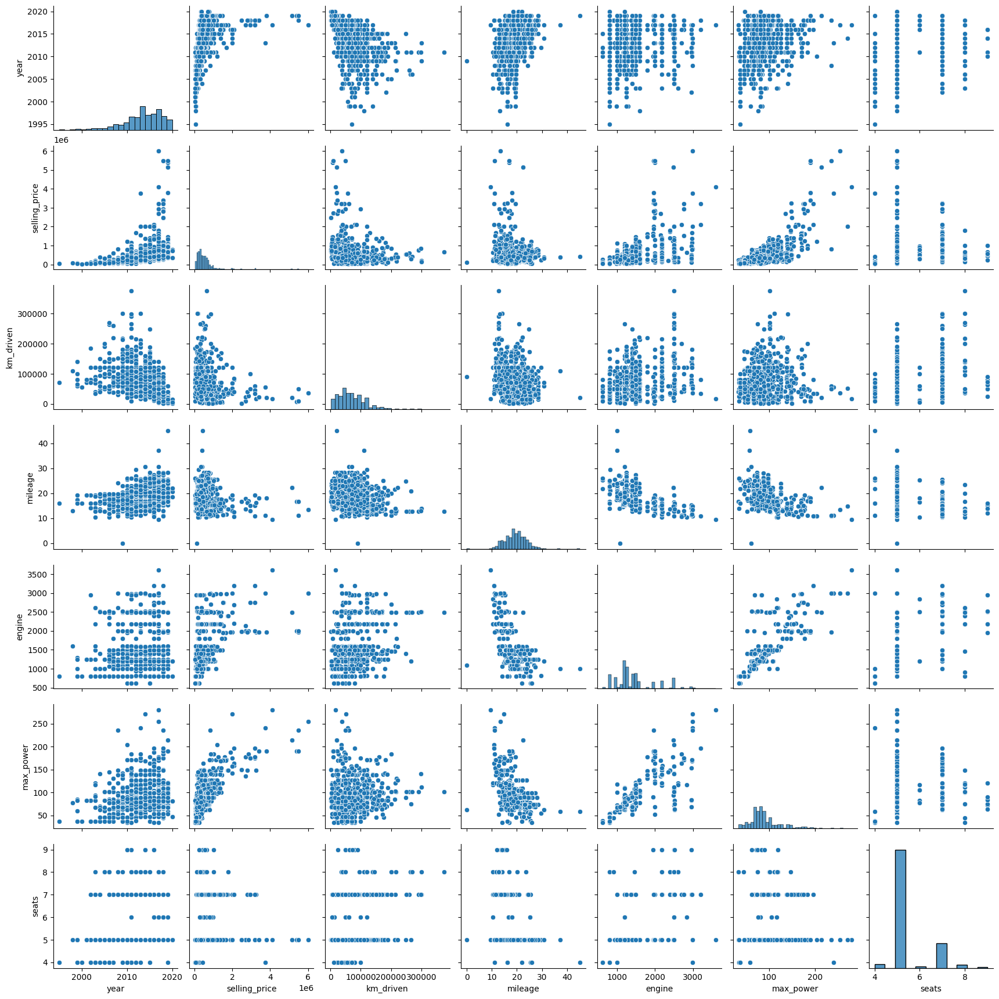

In [ ]:
# Постройте pairplot по тестовым данным

sns.pairplot(df_test)

Похожими ли оказались совокупности при разделении на трейн и тест?
>Да. Распределения и точечные диаграммы схожи. Различия лишь в плотности и некотором количестве выбросов, что объясняется тем, что тест просто меньше по размерам.

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [ ]:
# Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи pd.corr()
df_train.corr(method='pearson', numeric_only=True)

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.323648,0.002819,0.156927,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.111028,0.447672,0.693682,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.171898,0.229766,0.024581,0.192328
mileage,0.323648,-0.111028,-0.171898,1.000000,-0.561480,-0.377347,-0.436732
engine,0.002819,0.447672,0.229766,-0.561480,1.000000,0.681933,0.652172
max_power,0.156927,0.693682,0.024581,-0.377347,0.681933,1.000000,0.243964
seats,0.041178,0.149953,0.192328,-0.436732,0.652172,0.243964,1.000000


<Axes: >

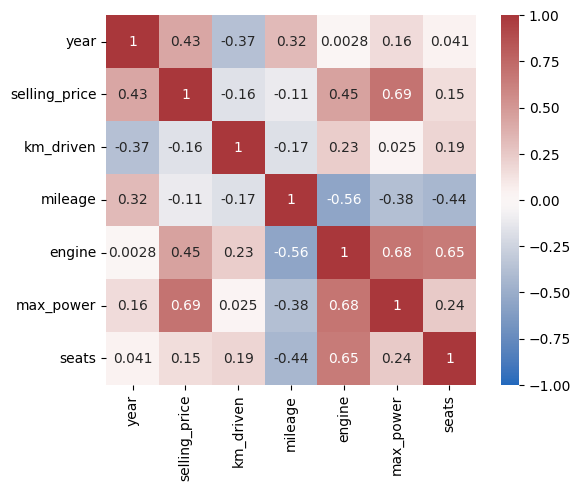

In [ ]:
corr_table = df_train.corr(method='pearson', numeric_only=True)

sns.heatmap(corr_table,
            cmap=sns.color_palette("vlag", as_cmap=True), square = True, annot = True,
            vmin=-1, vmax=1)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

Какие 2 признака наименее скоррелированы между собой?
>```year``` и ```engine```.

Между какими наблюдается довольно сильная положительная линейная зависимость?
>```max_power``` и ```selling_price```; ```max_power``` и ```engine```; ```seats``` и ```engine```.

Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
>Отрицательная корреляция средняя (или даже не сильно выраженная $R^2\approx 0.01$) - ```-0.37```. Поэтому утверждать это можно только если это достаточно осторожное утверждение :)

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

>Корреляции между категориальными признаками. Иногда их также имеет смысл посмотреть. Это V-мера Крамера.

In [ ]:
!pip install association-metrics -q

  Preparing metadata (setup.py) ... done


In [ ]:
import association_metrics as am

df_cat = df_train.apply(lambda x: x.astype("category") if x.dtype == "object" else x)

cramersv = am.CramersV(df_cat)

cram_fit = cramersv.fit()

/usr/local/lib/python3.10/dist-packages/association_metrics/categorical.py:100: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  self.matrix[x][y] = 1
/usr/local/lib/python3.10/dist-packages/association_metrics/categorical.py:104: FutureWarning

<Axes: >

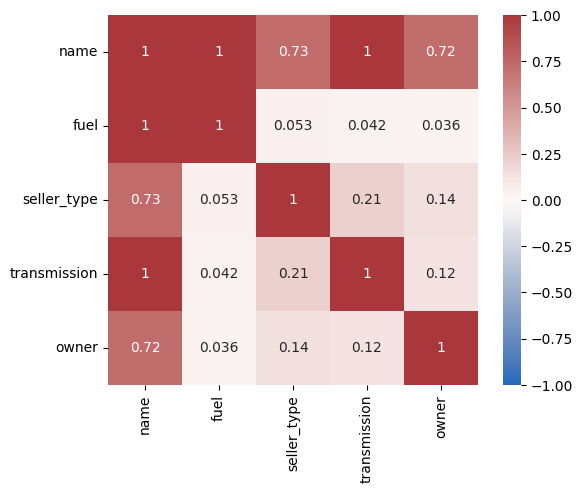

In [ ]:
sns.heatmap(pd.DataFrame(cram_fit),
            cmap=sns.color_palette("vlag", as_cmap=True), square = True, annot = True,
            vmin=-1, vmax=1)

> Корреляции между всеми переменными, включая категориальные. Так мы сможем вычленить, к примеру, потенциально важные признаки.

In [ ]:
!pip install phik -q

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']


/usr/local/lib/python3.10/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


<Axes: >

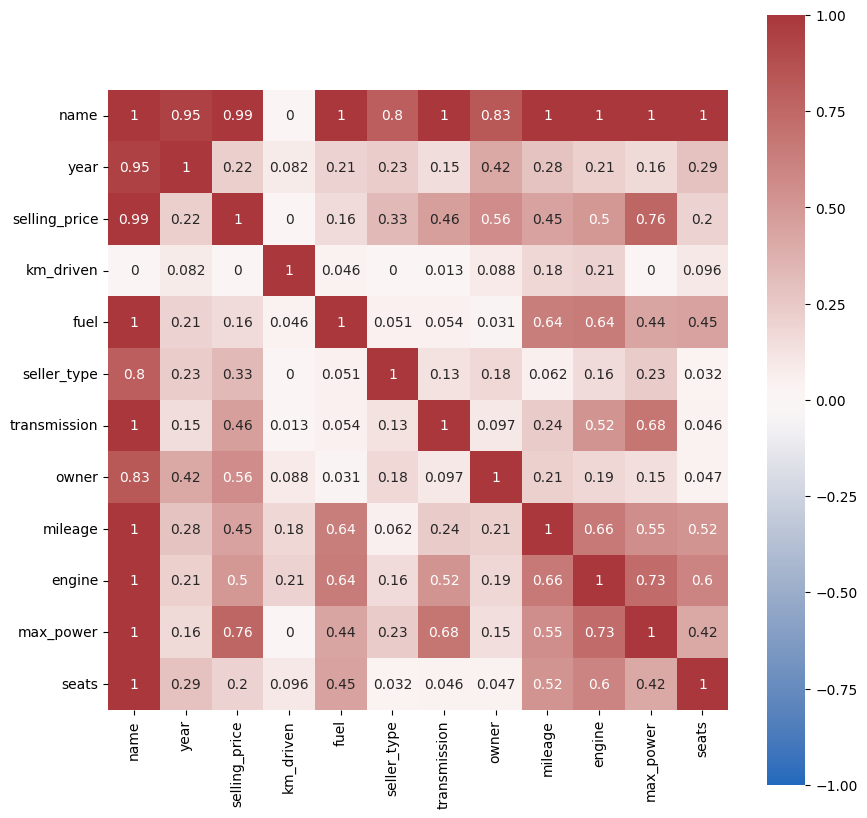

In [ ]:
import phik

plt.figure(figsize=(10,10))

ph = df_train.phik_matrix()

sns.heatmap(ph,
            cmap=sns.color_palette("vlag", as_cmap=True), square = True, annot = True,
            vmin=-1, vmax=1)

> Есть довольно большие корреляции категориальных переменных и целевой переменной. Так что по идее, их добавление в модель может улучшить её качество.

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [ ]:
y_train = df_train['selling_price']
X_train = df_train.select_dtypes(exclude=object).drop(['selling_price'], axis=1)

In [ ]:
assert X_train.shape == (5840, 6)

In [ ]:
y_test = df_test['selling_price']
X_test = df_test.select_dtypes(exclude=object).drop(['selling_price'], axis=1)

In [ ]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()

lr.fit(X_train, y_train)

pred_train = lr.predict(X_train)
pred_test = lr.predict(X_test)

print('Train\t''MSE: ' + str(MSE(y_train, pred_train)) + '\tR^2: ' + str(r2_score(y_train, pred_train)))
print('Test\t''MSE: ' + str(MSE(y_test, pred_test)) + '\tR^2: ' + str(r2_score(y_test, pred_test)))

Train	MSE: 116571864588.69211	R^2: 0.593313772133494
Test	MSE: 232851100210.50082	R^2: 0.5949207847688076


### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(X_train)


X_train_scaler = scaler.transform(X_train)
X_test_scaler = scaler.transform(X_test)

lr_scaler = LinearRegression()

lr_scaler.fit(X_train_scaler, y_train)

pred_train_scaler = lr_scaler.predict(X_train_scaler)
pred_test_scaler = lr_scaler.predict(X_test_scaler)

print('Train\t''MSE: ' + str(MSE(y_train, pred_train_scaler)) + '\tR^2: ' + str(r2_score(y_train, pred_train_scaler)))
print('Test\t''MSE: ' + str(MSE(y_test, pred_test_scaler)) + '\tR^2: ' + str(r2_score(y_test, pred_test_scaler)))

Train	MSE: 116571864588.69214	R^2: 0.5933137721334938
Test	MSE: 232851100210.4932	R^2: 0.5949207847688209


### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [ ]:
lr_scaler.coef_

array([152737.56498637, -44057.69778057,  29480.58416579,  58981.96076691,
       324864.67617485, -22379.49597601])

In [ ]:
print('Наиболее информативный признак:', X_train.columns[max(range(len(lr_scaler.coef_)), key=lambda x: abs(lr_scaler.coef_[x]))])

Наиболее информативный признак: max_power


### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
# Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество

from sklearn.linear_model import Lasso

lasso = Lasso()

lasso.fit(X_train_scaler, y_train)

pred_train_lasso = lasso.predict(X_train_scaler)
pred_test_lasso = lasso.predict(X_test_scaler)

print('Train\t''MSE: ' + str(MSE(y_train, pred_train_lasso)) + '\tR^2: ' + str(r2_score(y_train, pred_train_lasso)))
print('Test\t''MSE: ' + str(MSE(y_test, pred_test_lasso)) + '\tR^2: ' + str(r2_score(y_test, pred_test_lasso)))

Train	MSE: 116571864598.75142	R^2: 0.5933137720983999
Test	MSE: 232851778753.48618	R^2: 0.5949196043420897


>Качество то же, что и  обычной линейной модели - хорошее. Если судить по R^2. Хотя по разницу в MSE на трейне ина тесте, кажется, что есть сильное переобучение.


In [ ]:
#Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.
lasso.coef_

array([152737.29696757, -44056.58587754,  29478.79196829,  58977.17422234,
       324865.56339529, -22376.5762967 ])

>Не занулила. У нас нет малозначимых весов. У нас все веса большие. А регуляризаия же зануляет малозначимые веса (и не всегда зануляет, может просто уменьшать). Нужно изменить параметры, чтобы добиться зануления. Но это, как я проверил, приведёт к ухудшению модели.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [ ]:
from sklearn.model_selection import GridSearchCV

lasso = Lasso()

param_grid = {'alpha': [0.00001, 0.1, 0.25, 0.5, 0.6, 0.7]}

grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, cv=10, scoring='neg_mean_squared_error')

grid_search.fit(X_train_scaler, y_train)

best_model = grid_search.best_estimator_
weights = best_model.coef_
zero_weights = np.sum(weights == 0)

print('Лучший параметр alpha:', grid_search.best_params_['alpha'])
print('Количество обученных моделей:', int(10*len(param_grid['alpha'])))
print('Количество занулённых весов:', zero_weights)

Лучший параметр alpha: 0.7
Количество обученных моделей: 60
Количество занулённых весов: 0


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [ ]:
from sklearn.linear_model import ElasticNet

In [ ]:
elastic_net = ElasticNet()

param_grid = {'alpha': [0.00001, 0.1, 0.25, 0.5, 0.6, 0.7]}

grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, cv=10, scoring='neg_mean_squared_error')

grid_search.fit(X_train_scaler, y_train)

num_models = len(param_grid['alpha']) * 10

best_params = grid_search.best_params_

print('Лучшие гиперпараметры:', best_params)
print('Количество обученных моделей:', int(num_models))

Лучшие гиперпараметры: {'alpha': 0.7}
Количество обученных моделей: 60


# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [ ]:
len(df_train['name'].unique())

1924

In [ ]:
y_test_cat = df_test['selling_price']
y_train_cat = df_train['selling_price']

X_train_cat = df_train.drop(['name', 'selling_price'], axis=1)
X_test_cat = df_test.drop(['name', 'selling_price'], axis=1)

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
assert X_train_cat.shape == (5840, 10)

In [ ]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

> Но ```seats``` же теперь int. Но хорошо, сделаю как ```objext```.

In [ ]:
X_train_cat['seats'] = X_train_cat['seats'].astype('object')
X_test_cat['seats'] = X_test_cat['seats'].astype('object')

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(drop='first')

# Обучение OneHotEncoder на тренировочном наборе и применение к тестовому
encoded_train = encoder.fit_transform(X_train_cat.select_dtypes('object')).toarray()
encoded_test = encoder.transform(X_test_cat.select_dtypes('object')).toarray()

# Преобразование результатов в DataFrame
encoded_train_df = pd.DataFrame(encoded_train, columns=encoder.get_feature_names_out(list(X_train_cat.select_dtypes('object').columns)))
encoded_test_df = pd.DataFrame(encoded_test, columns=encoder.get_feature_names_out(X_test_cat.select_dtypes('object').columns))

# Объединение закодированных данных с остальными признаками
X_train_cat_encoded = pd.concat([X_train_cat.select_dtypes(exclude='object').reset_index(drop=True), encoded_train_df.reset_index(drop=True)], axis=1)
X_test_cat_encoded = pd.concat([X_test_cat.select_dtypes(exclude='object').reset_index(drop=True), encoded_test_df.reset_index(drop=True)], axis=1)

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
for i in X_train_cat_encoded.columns:
  X_train_cat_encoded.rename(columns={i: i.replace(' ', '_')}, inplace=True)
  X_test_cat_encoded.rename(columns={i: i.replace(' ', '_')}, inplace=True)

In [ ]:
scaler_en = StandardScaler()

scaler_en.fit(X_train_cat_encoded)


X_train_cat_encoded_scaler = scaler_en.transform(X_train_cat_encoded)
X_test_cat_encoded_scaler = scaler_en.transform(X_test_cat_encoded)

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

rid = Ridge()

param_grid = {'alpha': [0.00001, 0.1, 0.25, 0.5, 0.6, 0.7]}

grid_search = GridSearchCV(estimator=rid, param_grid=param_grid, cv=10, scoring='r2')

grid_search.fit(X_train_cat_encoded_scaler, y_train)

best_model = grid_search.best_estimator_
weights = best_model.coef_
zero_weights = np.sum(weights == 0)

print('Лучший параметр alpha:', grid_search.best_params_['alpha'])
print('Количество обученных моделей:', int(10*len(param_grid['alpha'])))
print('Количество занулённых весов:', zero_weights)

Лучший параметр alpha: 0.7
Количество обученных моделей: 60
Количество занулённых весов: 0


In [ ]:
elastic_net = ElasticNet()

param_grid = {'alpha': [0.00001, 0.1, 0.25, 0.5, 0.6, 0.7]}

grid_search = GridSearchCV(estimator=rid, param_grid=param_grid, cv=10, scoring='r2')

grid_search.fit(X_train_cat_encoded_scaler, y_train)

num_models = len(param_grid['alpha']) * 10

best_params = grid_search.best_params_
print('Лучшие гиперпараметры:', best_params)
print('Количество обученных моделей:', num_models)

Лучшие гиперпараметры: {'alpha': 0.7}
Количество обученных моделей: 60


In [ ]:
rid = Ridge(alpha=0.7)

rid.fit(X_train_cat_encoded_scaler, y_train)

pred_train_rid = rid.predict(X_train_cat_encoded_scaler)
pred_test_rid = rid.predict(X_test_cat_encoded_scaler)

print('Train\t''MSE: ' + str(MSE(y_train, pred_train_rid)) + '\tR^2: ' + str(r2_score(y_train, pred_train_rid)))
print('Test\t''MSE: ' + str(MSE(y_test, pred_test_rid)) + '\tR^2: ' + str(r2_score(y_test, pred_test_rid)))

Train	MSE: 95209513087.09265	R^2: 0.6678409677067783
Test	MSE: 214884839710.25494	R^2: 0.6261757743200684


>Да, немного удалось.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metric(y_true, y_pred):
  met = 0
  for i in range(len(y_true)):
    if abs(y_true[i] - y_pred[i]) <= 0.1*y_true[i]:
      met += 1
  return met/len(y_true)

In [ ]:
print('Линейная регрессия:', business_metric(y_test, pred_test))
print('Lasso:', business_metric(y_test, pred_test_lasso))
print('Ridge:', business_metric(y_test, pred_test_rid))

Линейная регрессия: 0.224
Lasso: 0.224
Ridge: 0.247


>Ridge явно решает задачу чуть лучше (но это потому, что для неё мы добавили категориальные фичи - в противном случае она была бы такой же, как и остальные модели - проверял). Хотя мне метрика не нравится. Потому что отклонений выше 10% может быть очень много или очень мало. И наоборот, модель может идеально предсказывать остальные значения и отклоняться в плохих прогнозах лишь на менее 10%.

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Writing main.py


Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>



>Это кот Сабрины! И нет, не Сэйлем Сабрины Спеллман.